In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline
%config IPython.matplotlib.backend = "retina"
from matplotlib import rcParams
rcParams["savefig.dpi"] = 300
rcParams["figure.dpi"] = 300

In [3]:
import la_forge.core as co
import la_forge.diagnostics as dg
from enterprise.signals import parameter
from QuickCW.PulsarDistPriors import PXDistPrior, DMDistPrior
import os, copy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

In [4]:
chaindir_path = '/vast/palmer/home.grace/bbl29/project/targeted_cws_ng15/data/chains/ng15_v1p1'

In [5]:
labels = ['Gaussian priors', 'QuickCW priors']
core_paths = [f'{chaindir_path}/NGC_3115_49nHz_det/core.h5', f'{chaindir_path}/3C66B_det/core.h5']
cores = [co.Core(corepath=cp, burn=0) for cp in core_paths]

In [6]:
def plot_chains(core, hist=True, pars=None, exclude=None,
                ncols=3, bins=40, suptitle=None, color='k',
                publication_params=False, titles=None,
                linestyle=None, plot_map=False, truths=None,
                save=False, show=True, linewidth=1,
                log=False, title_y=1.01, hist_kwargs={},
                plot_kwargs={}, legend_labels=None, real_tm_pars=True,
                legend_loc=None, draw_prior=False, plot_chains=True, **kwargs):
    """Function to plot histograms or traces of chains from cores.

    Parameters
    ----------
    core : {`la_forge.core.Core`,
            `la_forge.core.HyperModelCore`,
            `la_forge.core.TimingCore`,
            `la_forge.slices.SlicedCore`}

    hist : bool, optional
        Whether to plot histograms. If False then traces of the chains will be
        plotted.

    pars : list of str, optional
        List of the parameters to be plotted.

    exclude : list of str, optional
        List of the parameters to be excluded from plot.

    ncols : int, optional
        Number of columns of subplots to use.

    bins : int, optional
        Number of bins to use in histograms.

    suptitle : str, optional
        Title to use for the plots.

    color : str or list of str, optional
        Color to use for histograms.

    publication_params=False,

    titles=None,

    linestyle : str,

    plot_map=False,

    save=False,
    show=True,
    linewidth=1,
    log=False,
    title_y=1.01,
    hist_kwargs={},
    plot_kwargs={},
    legend_labels=None,
    legend_loc=None,

    """
    if pars is not None:
        params = pars
    elif exclude is not None and pars is not None:
        raise ValueError('Please remove excluded parameters from `pars`.')
    elif exclude is not None:
        if isinstance(core, list):
            params = set()
            for c in core:
                params.intersection_update(c.params)
        else:
            params = core.params
        params = list(params)
        for p in exclude:
            params.remove(p)
    elif pars is None and exclude is None:
        if isinstance(core, list):
            params = core[0].params
            for c in core[1:]:
                params = [p for p in params if p in c.params]
        else:
            params = core.params

    if isinstance(core, list):
        fancy_par_names=core[0].fancy_par_names
        if linestyle is None:
            linestyle = ['-' for ii in range(len(core))]

        if isinstance(plot_map, list):
            pass
        else:
            plot_map = [plot_map for ii in range(len(core))]
    else:
        fancy_par_names=core.fancy_par_names

    L = len(params)

    if suptitle is None:
        psr_name = copy.deepcopy(params[0])
        if psr_name[0] == 'B':
            psr_name = psr_name[:8]
        elif psr_name[0] == 'J':
            psr_name = psr_name[:10]
    else:
        psr_name = None

    nrows = int(L // ncols)
    if L %ncols > 0:
        nrows +=1

    if publication_params:
        fig = plt.figure()
    else:
        fig = plt.figure(figsize=[15, 4*nrows])

    for ii, p in enumerate(params):
        cell = ii+1
        axis = fig.add_subplot(nrows, ncols, cell)
        if hist:
            if truths is not None:
                ans = truths[p]
                plt.axvline(ans, linewidth=2,
                            color='k', linestyle='-.')

            if isinstance(core, list):
                for jj, c in enumerate(core):
                    gpar_kwargs= dg._get_gpar_kwargs(c, real_tm_pars)
                    if plot_chains:
                        phist=plt.hist(c.get_param(p, **gpar_kwargs),
                                       bins=bins, density=True, log=log,
                                       linewidth=linewidth,
                                       linestyle=linestyle[jj],
                                       histtype='step', **hist_kwargs)

                    if plot_map[jj]:
                        pcol=phist[-1][-1].get_edgecolor()
                        plt.axvline(c.get_map_param(p), linewidth=1,
                                    color=pcol, linestyle='--')

            else:
                gpar_kwargs= dg._get_gpar_kwargs(core, real_tm_pars)
                if plot_chains:
                    phist=plt.hist(core.get_param(p, **gpar_kwargs),
                                   bins=bins, density=True, log=log,
                                   linewidth=linewidth,
                                   histtype='step', **hist_kwargs)
                if plot_map:
                    pcol=phist[-1][-1].get_edgecolor()
                    plt.axvline(c.get_map_param(p), linewidth=1,
                                color=pcol, linestyle='--')

                if truths is not None:
                    if p not in truths:
                        print(p + ' was not found in truths dict.')
                        continue
                    plt.axvline(truths[p], linewidth=2,
                                color='k', linestyle='-.')

        else:
            gpar_kwargs= dg._get_gpar_kwargs(core, real_tm_pars)
            plt.plot(core.get_param(p, to_burn=True, **gpar_kwargs),
                     lw=linewidth, **plot_kwargs)
        
        if draw_prior:
            if isinstance(core, list):
                for i, c in enumerate(core):
                    x, y = get_prior_distr(c, p)
                    axis.plot(x, y, f'--C{i}')
            else:
                x, y = get_prior_distr(core, p)
                axis.plot(x, y, '--C0')
        
        if (titles is None) and (fancy_par_names is None):
            if psr_name is not None:
                par_name = p.replace(psr_name+'_', '')
            else:
                par_name = p
            axis.set_title(par_name)
        elif titles is not None:
            axis.set_title(titles[ii])
        elif fancy_par_names is not None:
            axis.set_title(fancy_par_names[ii])
        if not ncols == 1:
            axis.set_yticks([])
        xticks = kwargs.get('xticks')
        if xticks is not None:
            axis.set_xticks(xticks)

    if suptitle is None:
        guess_times = np.array([psr_name in p for p in params], dtype=int)
        yes = np.sum(guess_times)
        if yes/guess_times.size > 0.5:
            suptitle = 'PSR {0} Noise Parameters'.format(psr_name)
        else:
            suptitle = 'Parameter Posteriors    '

    if legend_labels is not None:
        patches = []
        colors = ['C{0}'.format(ii) for ii in range(len(legend_labels))]
        for ii, lab in enumerate(legend_labels):
            patches.append(mpatches.Patch(color=colors[ii], label=lab))

        fig.legend(handles=patches, loc=legend_loc)

    fig.tight_layout(pad=0.4)
    fig.suptitle(suptitle, y=title_y, fontsize=18)
    # fig.subplots_adjust(top=0.96)
    xlabel = kwargs.get('xlabel')
    if xlabel is not None:
        fig.text(0.5, -0.02, xlabel, ha='center', usetex=False)

    if save:
        plt.savefig(save, dpi=150, bbox_inches='tight')
    if show:
        plt.show()

    plt.close()

In [7]:
def get_prior_distr(core, param):
    idx = core.params.index(param)
    pline = core.priors[idx]
    prior_type = pline[pline.index(':')+1:pline.index('(')]
    # setup x-axis for the plot
    if prior_type == 'Uniform':
        pmin = float(pline[pline.index('pmin')+5:pline.index(', pmax')])
        pmax = float(pline[pline.index('pmax')+5:-1])
        x = np.linspace(pmin, pmax, 300)
        y = parameter.UniformPrior(x, pmin, pmax)
        #prior_dist = sps.uniform(loc=pmin, scale=pmax-pmin)
        #y = prior_dist.pdf(x)
    elif prior_type == 'Normal':
        mu = float(pline[pline.index('mu')+3:pline.index(', sigma')])
        sigma = float(pline[pline.index('sigma')+6:-1])
        #prior_dist = sps.norm(loc=mu, scale=sigma)
        pmin = np.min([mu-3*sigma, np.min(core.chain[core.burn:,idx])])
        pmax = np.max([mu+3*sigma, np.max(core.chain[core.burn:,idx])])
        x = np.linspace(pmin, pmax, 300)
        y = parameter.NormalPrior(x, mu, sigma)
        #y = prior_dist.pdf(x)
    elif prior_type == 'LinearExp':
        pmin = float(pline[pline.index('pmin')+5:pline.index(', pmax')])
        pmax = float(pline[pline.index('pmax')+5:-1])
        x = np.linspace(pmin, pmax, 300)
        y = parameter.LinearExpPrior(x, pmin, pmax)
    elif prior_type == 'PXDist':
        dist = float(pline[pline.index('dist=')+5:pline.index(', err')])
        err = float(pline[pline.index('err')+4:-1])
        pmin = np.min([dist-3*err, np.min(core.chain[core.burn:,idx])])
        pmin = np.max([pmin, 0.005])
        pmax = np.max([dist+3*err, np.max(core.chain[core.burn:,idx])])
        pmax = np.min([pmax,30])
        x = np.linspace(pmin, pmax, 300)
        y = PXDistPrior(x, dist, err)
    elif prior_type == 'DMDist':
        dist = float(pline[pline.index('dist=')+5:pline.index(', err')])
        err = float(pline[pline.index('err')+4:-1])
        pmin = np.min([dist-2*err, np.min(core.chain[core.burn:,idx])])
        pmax = np.max([dist+2*err, np.max(core.chain[core.burn:,idx])])
        x = np.linspace(pmin, pmax, 300)
        y = DMDistPrior(x, dist, err)
    return x, y

In [51]:
plot_chains(cores, hist=True, pars=[p for p in cores[0].params if 'p_dist' in p],
            draw_prior=True, legend_labels=labels)

In [8]:
plot_chains(cores, hist=True, pars=[p for p in cores[0].params if 'p_dist' in p],
            draw_prior=True, legend_labels=labels, plot_chains=False, ncols=6)

Diagnose bug in PXDistPrior

In [12]:
pline

'J2322+2057_cw_p_dist:Normal(mu=0.9990009990009991, sigma=0.2095806291610488)'

In [26]:
param = 'J1741+1351_cw_p_dist'
idx = cores[0].params.index(param)
pline = cores[0].priors[idx]
prior_type = pline[pline.index(':')+1:pline.index('(')]
dist = float(pline[pline.index('mu=')+3:pline.index(', sigma')])
err = float(pline[pline.index('sigma')+6:-1])

In [53]:
from targeted_cws_ng15.Dists_Parameters import PXDistSampler
from QuickCW.PulsarDistPriors import PXDistSampler as PXDistSampler2
from QuickCW.PulsarDistPriors import PXDistPrior as PXDistPrior2

In [48]:
def PXDistSampler(dist, err, size=None):
    """Sampling function for PXDist parameters.

    :param dist:    mean distance
    :param err:     distance error
    :param size:    length for vector parameter

    :return:        random draw from prior (float or ndarray with lenght size)
    """

    pi = 1/dist
    pi_err = err/dist**2

    #just draw parallax from Gaussian with proper mean and std and return
    #its inverse. But also don't allow values that are too small
    
    return 1/np.random.normal(pi, pi_err)

In [75]:
def PXDistPrior(value, dist, err):
    """Prior function for PXDist parameters.

    :param value:   point where we want the prior evaluated
    :param dist:    mean distance
    :param err:     distance error

    :return:        prior value
    """
    
    pi = 1/dist
    pi_err = err/dist**2
    
    prior = (1/(np.sqrt(2*np.pi)*pi_err*value**2)*
             np.exp(-(pi-value**(-1))**2/(2*pi_err**2)))
    
    # this prevents overly large or negative pdist values
    if isinstance(prior, np.ndarray): # array case
        prior[value < 0.01] *= 0
    elif value < 0.01: # float case
        prior = 0
    
    return prior

In [82]:
samples = [PXDistSampler(dist, err) for i in range(50000)]
samples2 = [PXDistSampler2(dist, err) for i in range(50000)]

In [74]:
np.unique(PXDistPrior(x, dist, err)[x<0])

array([0.])

(1e-08, 1)

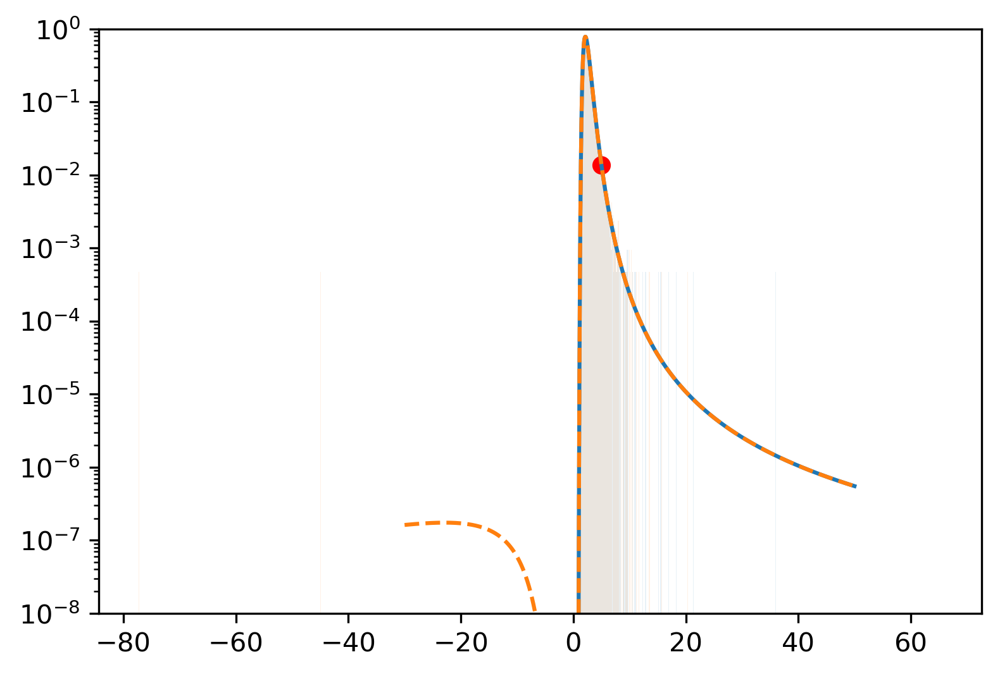

In [85]:
x = np.linspace(-30, 50, 10000)
fig, ax = plt.subplots(figsize=(6,4))
ax.hist(samples, bins='auto', alpha=0.1, density=True)
ax.hist(samples2, bins='auto', alpha=0.1, density=True)
ax.plot(x, PXDistPrior(x, dist, err), '-C0')
ax.plot(x, PXDistPrior2(x, dist, err), '--C1')
ax.scatter([5,-10], [PXDistPrior(5, dist, err), PXDistPrior(-10, dist, err)], color='r')
ax.semilogy()
ax.set_ylim([1e-8, 1])

In [78]:
import scipy.integrate as spi

In [86]:
x = np.linspace(-300, 500, 10000)
spi.simpson(PXDistPrior(x, dist, err), x=x), spi.simpson(PXDistPrior2(x, dist, err), x=x)

(0.9999846595514401, 0.999996814011405)

In [29]:
np.min(samples)

1.1939008683205965

In [17]:
PXDistPrior(0, dist, err)

/vast/palmer/home.grace/bbl29/QuickCW/QuickCW/PulsarDistPriors.py:87: RuntimeWarning: divide by zero encountered in scalar divide
  return 1/(np.sqrt(2*np.pi)*pi_err*value**2)*np.exp(-(pi-value**(-1))**2/(2*pi_err**2))


ZeroDivisionError: 0.0 cannot be raised to a negative power

In [15]:
x = np.linspace(0,5,1000)
PXDistPrior(x, dist, err)

/vast/palmer/home.grace/bbl29/QuickCW/QuickCW/PulsarDistPriors.py:87: RuntimeWarning: divide by zero encountered in divide
  return 1/(np.sqrt(2*np.pi)*pi_err*value**2)*np.exp(-(pi-value**(-1))**2/(2*pi_err**2))
/vast/palmer/home.grace/bbl29/QuickCW/QuickCW/PulsarDistPriors.py:87: RuntimeWarning: divide by zero encountered in reciprocal
  return 1/(np.sqrt(2*np.pi)*pi_err*value**2)*np.exp(-(pi-value**(-1))**2/(2*pi_err**2))
/vast/palmer/home.grace/bbl29/QuickCW/QuickCW/PulsarDistPriors.py:87: RuntimeWarning: invalid value encountered in multiply
  return 1/(np.sqrt(2*np.pi)*pi_err*value**2)*np.exp(-(pi-value**(-1))**2/(2*pi_err**2))


array([            nan, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       0.00000000e+000, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       0.00000000e+000, 0.00000000e+000, 4.56763690e-320, 1.89652641e-289,
       9.83338942e-263, 2.68727059e-239, 1.23740069e-218, 2.47863554e-200,
       4.71190621e-184, 1.62216175e-169, 1.73348966e-156, 9.03716803e-145,
       3.36616089e-134, 1.23830950e-124, 5.92949325e-116, 4.68206790e-108,
       7.47332868e-101, 2.87523377e-094, 3.10623580e-088, 1.07637520e-082,
       1.34386532e-077, 6.69420312e-073, 1.45533323e-068, 1.49465290e-064,
       7.77815427e-061, 2.18269644e-057, 3.49091532e-054, 3.34326409e-051,
       2.00390421e-048, 7.82096007e-046, 2.05955969e-043, 3.77862438e-041,
       4.97153444e-039, 4

In [23]:
1/0.01

100.0

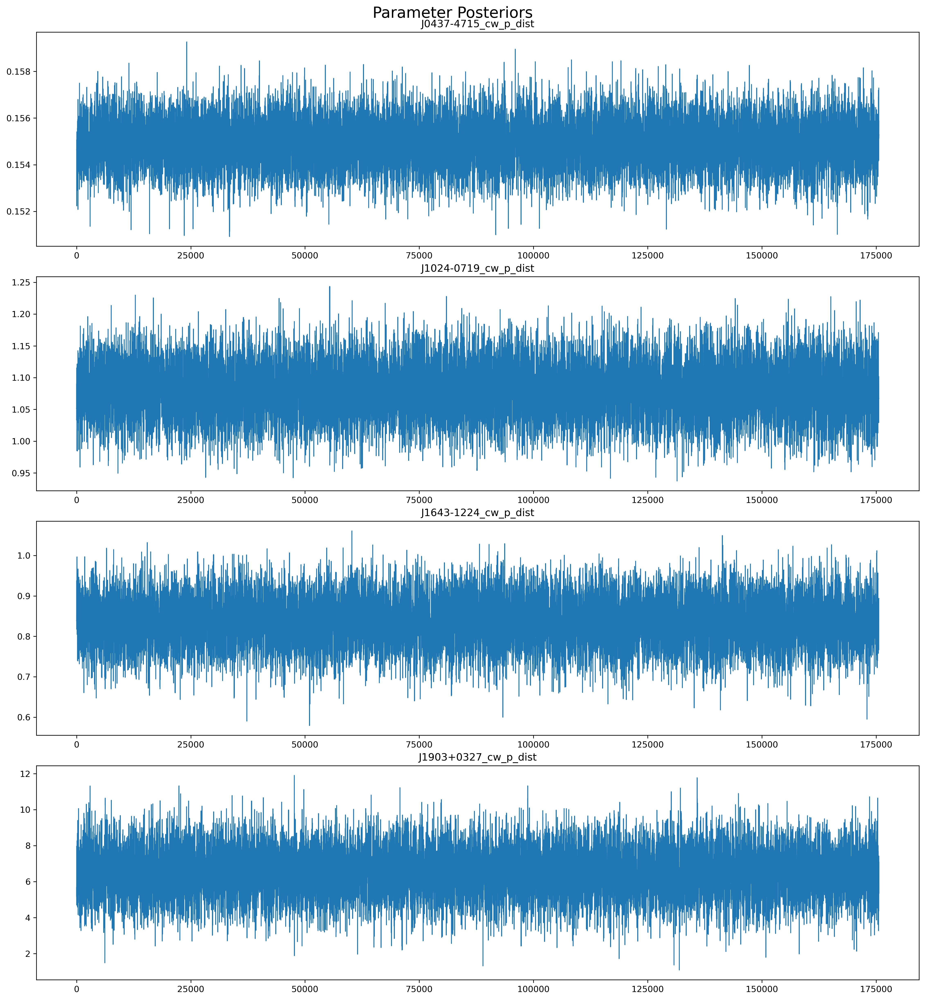

In [72]:
pars=['J0437-4715_cw_p_dist', 'J1024-0719_cw_p_dist', 'J1643-1224_cw_p_dist', 'J1903+0327_cw_p_dist']
plot_chains(cores[0], hist=False, pars=pars, ncols=1, titles=pars)